# Notebook for feature extraction from the MOVIES

The features that we want to extract are:
- brightness
- contrast
- saturation
- sound strength
- music presence

The features are extracted from the movies using the following methods:
- **brightness**:
    1. Divide the video in frames using: https://www.geeksforgeeks.org/python-program-extract-frames-using-opencv/
    2. Convert the image to HSV color space (the Value channel is an approximation for brightness)
    3. Sum up all the values of the pixels in the Value channel
    4. Divide that brightness sum by the area of the image, which is just the width times the height.
    5. This gave us one value: the average brightness of that image per each time stamp.
- **contrast**:
    1. Same as brightness just with contrast
- **saturation**:
    1. Same as brightness just with saturation
- **sound strength**:
    1. Follow: https://towardsdatascience.com/generate-any-sport-highlights-using-python-3695c98baead

In [1]:
from helper_corr_mtx import *
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import re
import seaborn as sns
from scipy.stats import pearsonr

## **LOAD THE DATA EXTRACTED**

In [2]:
df_images = pd.read_csv(f'/Users/silviaromanato/Desktop/SEMESTER_PROJECT/Material/Data/features_extracted/movie_features_Sintel_exp.csv')
print(df_images.columns)

Index(['average_brightness_left', 'average_saturation_left',
       'average_hue_left', 'average_brightness_right',
       'average_saturation_right', 'average_hue_right'],
      dtype='object')


/var/folders/4y/lsm2ngkn0cjfbpd_6bmg0__80000gn/T/ipykernel_22339/2341496580.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # 1 row, 3 columns of subplots


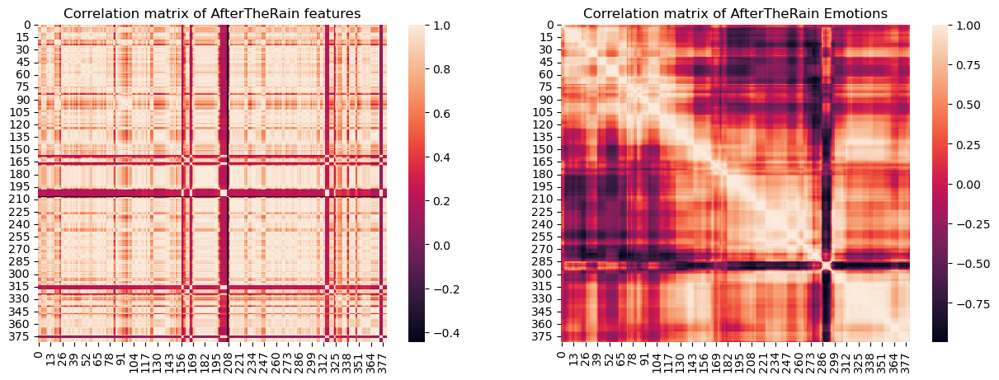

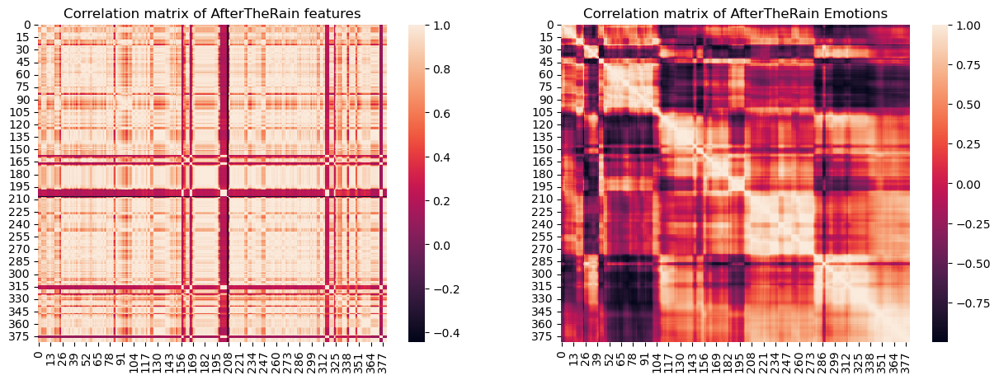

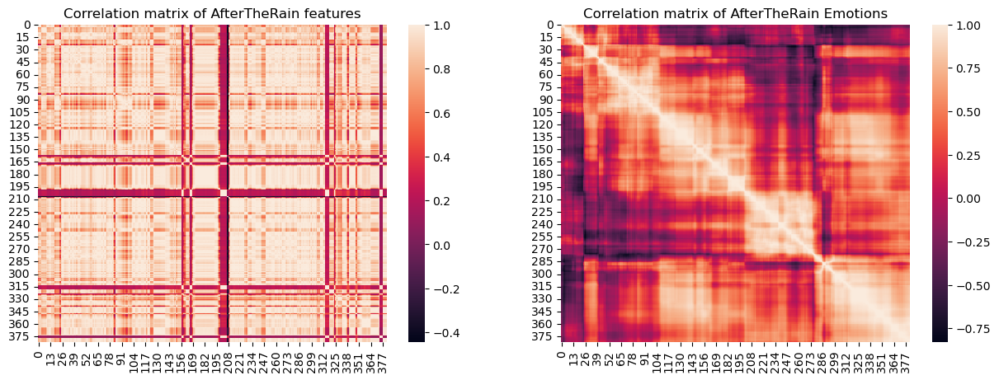

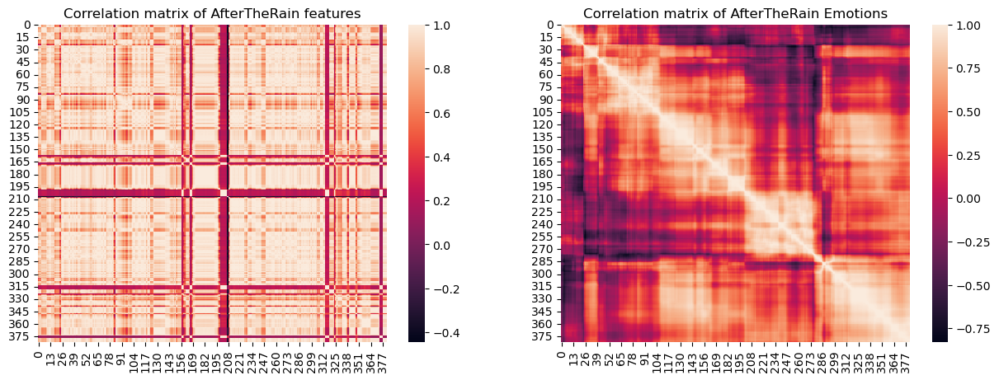

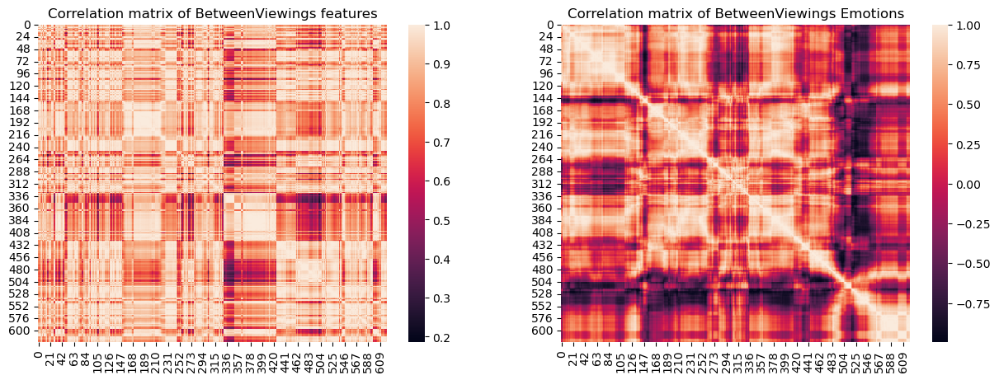

...

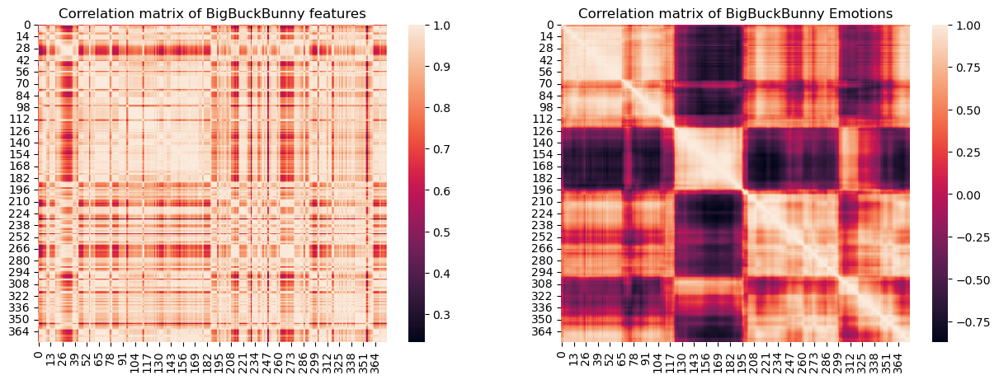

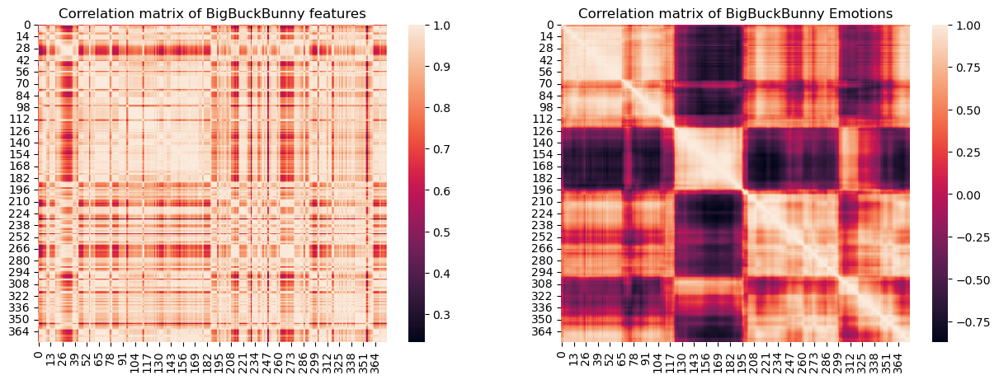

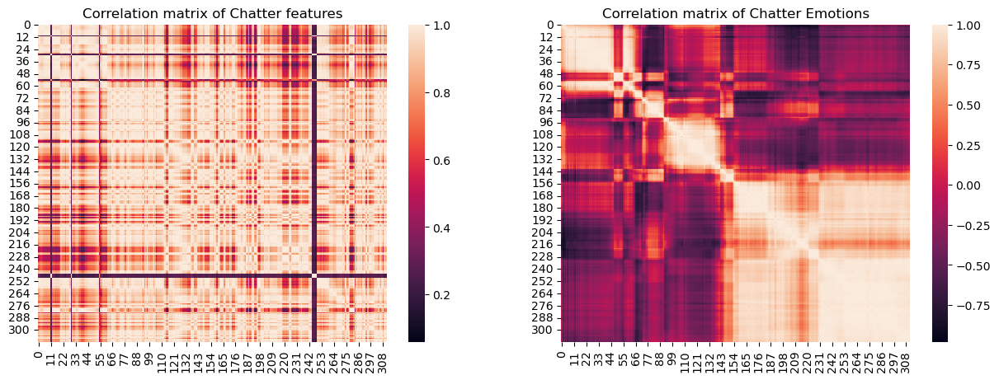

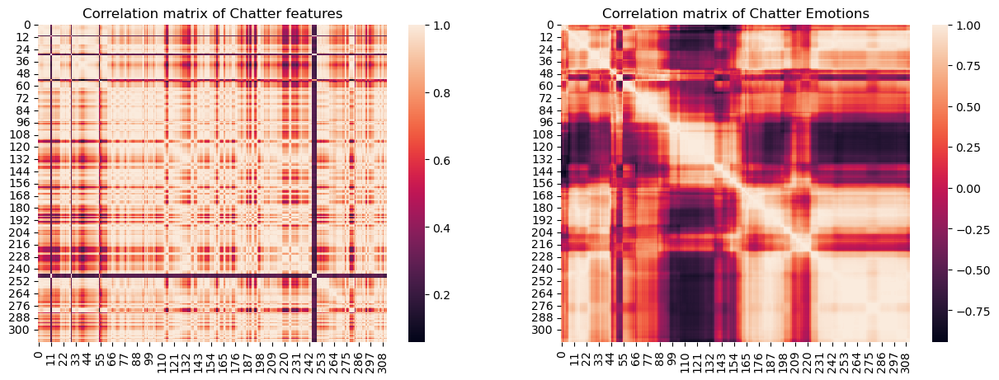

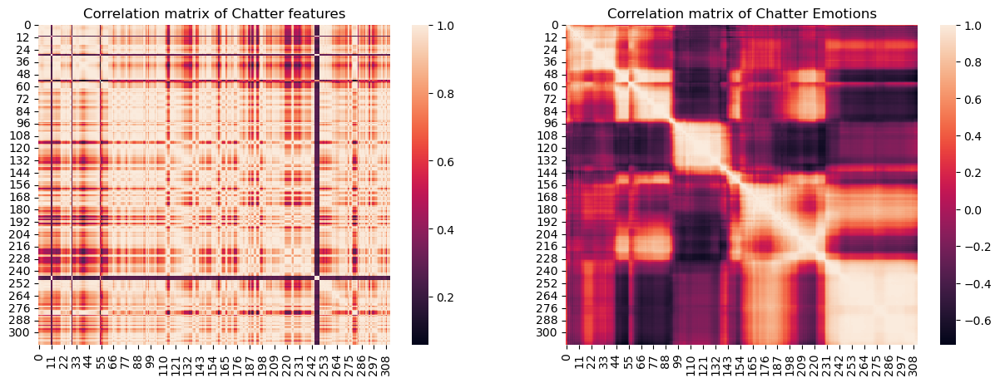

Error in callback <function flush_figures at 0x145853d30> (for post_execute):


KeyboardInterrupt: 

In [3]:
list_movies = ['AfterTheRain', 'BetweenViewings', 'BigBuckBunny', 'Chatter', 'FirstBite', 'LessonLearned', 'Payload', 'Sintel', 
               'Spaceman', 'Superhero', 'TearsOfSteel', 'ToClaireFromSonny', 'YouAgain', 'TheSecretNumber']

for movie_name in list_movies:
   for i, emotion in enumerate(['positive', 'negative', 'poistive and negative', 'all']):
   
      PATH_EMO = f'/Users/silviaromanato/Desktop/SEMESTER_PROJECT/Material/Data/EmoData/'
      emo = extract_corrmat_emo(PATH_EMO, movie_name)
      if emotion == 'all':
         emo = extract_corrmat_allregressors(PATH_EMO, movie_name)
      else:
         all_emo = emo[i]
      length = all_emo.shape[0]
      
      if i == 0:
         ############### IMAGES ################
         correlation_features = correlation_mtx_features(movie_name, columns=['spectralflux', 'rms', 'zcrs'])

      ############### CORRELATION ################
      correlation_features = np.array(correlation_features)
      correlation_features = np.nan_to_num(correlation_features)
      upper_triangle_feat = correlation_features[np.triu_indices_from(correlation_features, k=1)]
      upper_triangle_emo = all_emo[np.triu_indices_from(all_emo, k=1)]

      # compute the correlation 
      corr, _ = pearsonr(upper_triangle_feat, upper_triangle_emo)

      ############## PLOT ################

      # Create a figure with subplots
      fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # 1 row, 3 columns of subplots

      # Plot the correlation matrix of features
      sns.heatmap(correlation_features, ax=axes[0])
      axes[0].set_title(f'Correlation matrix of {movie_name} features')
      # axes[0].text(0.5, -0.4, f'Features used: all the features from images' + '\n' + f'and from sound {features_used}\nEmotions used: {emotion}',
      #             horizontalalignment='center', verticalalignment='center', transform=axes[0].transAxes)

      # Plot the correlation matrix of emotions
      sns.heatmap(all_emo, ax=axes[1])
      axes[1].set_title(f'Correlation matrix of {movie_name} Emotions')

      """# Compute and plot the scatter plot
      corr, _ = pearsonr(upper_triangle_feat, upper_triangle_emo)
      axes[2].scatter(upper_triangle_feat, upper_triangle_emo, s=1)
      axes[2].set_title(f'Scatter plot of {movie_name} features and emotions')
      axes[2].set_xlabel('Features')
      axes[2].set_ylabel('Emotions')
      axes[2].text(0.5, -0.2, f'Pearson\'s correlation: {corr}',
                  horizontalalignment='center', verticalalignment='center', transform=axes[2].transAxes)

      # Adjust layout
      plt.tight_layout()

      # Save or display the figure
      #plt.savefig(f'/Users/silviaromanato/Desktop/SEMESTER_PROJECT/Material/{movie_name}_plots.png')
      plt.show()

      if i == 0:
         fig, axes = plt.subplots(1, 4, figsize=(15, 4))  # 1 row, 3 columns of subplots
      corr, _ = pearsonr(upper_triangle_feat, upper_triangle_emo)
      axes[i].scatter(upper_triangle_feat, upper_triangle_emo, s=1)
      fig.subplots_adjust(wspace=0.35)
      axes[i].set_xlabel('Features')
      axes[i].set_ylabel(f'{emotion}')
      if corr > 0.2:
         axes[i].text(0.5, -0.25, f'Pearson\'s correlation: {corr:.3f}',
                     horizontalalignment='center', verticalalignment='center', transform=axes[i].transAxes, color = 'red')
      else: 
         fig.suptitle(f'Correlation between features of {movie_name} and the emotions')
         axes[i].text(0.5, -0.25, f'Pearson\'s correlation: {corr:.3f}',
                     horizontalalignment='center', verticalalignment='center', transform=axes[i].transAxes)
      if i == 3:
         plt.show()"""
    

## **NOW WITH FMRI DATA**

In [ ]:
list_movies = ['AfterTheRain', 'BetweenViewings', 'BigBuckBunny', 'Chatter', 'FirstBite', 'LessonLearned', 'Payload', 'Sintel', 'Spaceman', 'Superhero', 'TearsOfSteel', 'TheSecretNumber', 'ToClaireFromSonny', 'YouAgain']

In [ ]:

dict_fmri = {}
PATH_DATA = '/Users/silviaromanato/Desktop/SEMESTER_PROJECT/Material/Data/FMRI'
for movie_name in list_movies:
   for i, method in enumerate(['bold', 'edges', 'scaffold', 'triangles']):
   

      mtx_tt =pd.read_csv(PATH_DATA + f'/average_{method}/corr_matrix_ave_{method}_{movie_name}.txt', sep=' ', header=None)
      mtx_tt = mtx_tt.fillna(0)
      length = mtx_tt.shape[0]
      
      if i == 0:
         ############### IMAGES ################
         # split the movie name by the capital letter
         text = '_'.join(re.findall(r'[A-Z][a-z]*', movie_name))
         df_images = pd.read_csv(f'/Users/silviaromanato/Desktop/SEMESTER_PROJECT/Material/Data/features_extracted/movie_features_{text}_exp.csv')
         df_sound = pd.read_csv(f'/Users/silviaromanato/Desktop/SEMESTER_PROJECT/Material/Data/features_extracted/features_sound_{text}_exp.csv')

         # mean the columns from mfcc and chromagram
         df_sound['mean_mfcc'] = df_sound[['mfccs_0', 'mfccs_1', 'mfccs_2', 'mfccs_3', 'mfccs_4',
            'mfccs_5', 'mfccs_6', 'mfccs_7', 'mfccs_8', 'mfccs_9', 'mfccs_10',
            'mfccs_11', 'mfccs_12', 'mfccs_13', 'mfccs_14', 'mfccs_15', 'mfccs_16',
            'mfccs_17', 'mfccs_18', 'mfccs_19']].mean(axis=1) 
         df_sound['mean_chroma'] = df_sound[[ 'chromagram_0', 'chromagram_1',
            'chromagram_2', 'chromagram_3', 'chromagram_4', 'chromagram_5',
            'chromagram_6', 'chromagram_7', 'chromagram_8', 'chromagram_9',
            'chromagram_10', 'chromagram_11']].mean(axis=1)
         
         # drop the columns that are not used
         df_sound.drop(columns=['mfccs_0',
            'mfccs_1', 
            'mfccs_2', 'mfccs_3', 'mfccs_4',
            'mfccs_5', 'mfccs_6', 'mfccs_7', 'mfccs_8', 'mfccs_9', 'mfccs_10',
            'mfccs_11', 'mfccs_12', 'mfccs_13', 'mfccs_14', 'mfccs_15', 'mfccs_16',
            'mfccs_17', 'mfccs_18', 'mfccs_19', 
         'chromagram_0', 'chromagram_1',
            'chromagram_2', 'chromagram_3', 'chromagram_4', 'chromagram_5',
            'chromagram_6', 'chromagram_7', 'chromagram_8', 'chromagram_9',
            'chromagram_10', 'chromagram_11',
            #'mean_chroma',
            #'mean_mfcc',
            #'rms',
            #'zcrs',       
            ], inplace=True)

         features_used = df_sound.columns
         
         window_size1 = df_images.shape[0] // length
         images_mean = np.apply_along_axis(lambda x: np.convolve(x, np.ones(window_size1), mode='valid') / window_size1, axis=0, arr=df_images)

         window_size2 = df_sound.shape[0] // length
         sound_mean = np.apply_along_axis(lambda x: np.convolve(x, np.ones(window_size2), mode='valid') / window_size2, axis=0, arr=df_sound)

         # Select elements to represent the initial arrays
         selected_indices1 = np.linspace(0, len(images_mean) - 1, length, dtype=int)
         selected_indices2 = np.linspace(0, len(sound_mean) - 1, length, dtype=int)
         df_images = pd.DataFrame(images_mean[selected_indices1])
         df_sound = pd.DataFrame(sound_mean[selected_indices2])
         ############### CORRELATION ################
         correlation_features = Correlation_features(df_sound, df_images, movie_name)

      ############### CORRELATION ################
      mtx_tt = np.array(mtx_tt)
      correlation_features = np.array(correlation_features)
      correlation_features = np.nan_to_num(correlation_features)
      upper_triangle_feat = correlation_features[np.triu_indices_from(correlation_features, k=1)]
      upper_triangle_fmri = mtx_tt[np.triu_indices_from(mtx_tt, k=1)]

      # compute the correlation
      from scipy.stats import pearsonr
      corr, _ = pearsonr(upper_triangle_feat, upper_triangle_fmri)

      ############## PLOT ################

      """# Create a figure with subplots
      fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns of subplots

      # Plot the correlation matrix of features
      sns.heatmap(correlation_features, ax=axes[0])
      axes[0].set_title(f'Correlation matrix of {movie_name} features')
      axes[0].text(0.5, -0.4, f'Features used: all the features from images' + '\n' + f'and from sound {features_used}\Method used: {method}',
                  horizontalalignment='center', verticalalignment='center', transform=axes[0].transAxes)

      # Plot the correlation matrix of fmri
      sns.heatmap(mtx_tt, ax=axes[1])
      axes[1].set_title(f'Correlation matrix of {movie_name} / {method}')

      # Compute and plot the scatter plot
      corr, _ = pearsonr(upper_triangle_feat, upper_triangle_fmri)
      axes[2].scatter(upper_triangle_feat, upper_triangle_fmri, s=1)
      axes[2].set_title(f'Scatter plot of {movie_name} features and {method}')
      axes[2].set_xlabel('Features')
      axes[2].set_ylabel(f'{method}')
      axes[2].text(0.5, -0.2, f'Pearson\'s correlation: {corr}',
                  horizontalalignment='center', verticalalignment='center', transform=axes[2].transAxes)

      # Adjust layout
      plt.tight_layout()

      # Save or display the figure
      #plt.savefig(f'/Users/silviaromanato/Desktop/SEMESTER_PROJECT/Material/{movie_name}_plots.png')
      plt.show()"""
      if i == 0:
         fig, axes = plt.subplots(1, 4, figsize=(15, 4))  # 1 row, 3 columns of subplots
         # pad the subplots' width
         fig.subplots_adjust(wspace=0.35)
      corr, _ = pearsonr(upper_triangle_feat, upper_triangle_fmri)
      axes[i].scatter(upper_triangle_feat, upper_triangle_fmri, s=1)

      if corr > 0.2:
         axes[i].text(0.5, -0.25, f'Pearson\'s correlation: {corr:.3f}',
                  horizontalalignment='center', verticalalignment='center', transform=axes[i].transAxes, color='red')
         fig.suptitle(f'Scatter plot of the Correlation between features of {movie_name} and the methods', color = 'red')
         # place the subtitle up
         fig.subplots_adjust(top=0.9)
         axes[i].set_title(f'Features and {method}', color = 'red')
         axes[i].set_xlabel('Features', color = 'red')
         axes[i].set_ylabel(f'{method}', color = 'red')
      else:
         axes[i].text(0.5, -0.25, f'Pearson\'s correlation: {corr:.3f}',
                  horizontalalignment='center', verticalalignment='center', transform=axes[i].transAxes)
         fig.suptitle(f'Scatter plot of the Correlation between features of {movie_name} and the methods')
         axes[i].set_title(f'Features and {method}')
         axes[i].set_xlabel('Features')
         axes[i].set_ylabel(f'{method}')
      if i == 3:
         plt.show()

ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().